In [29]:
# Import libraries

import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import re
#!pip install chardet
#!pip install langdetect
#!pip install python-Levenshtein
#!pip install rapidfuzz
from langdetect import detect
#import chardet
#import missingno as msno

In [30]:
# Detect the encoding of the file.
#with open('Books.csv', 'rb') as f:
#    result = chardet.detect(f.read())

# Use the detected encoding.
#encoding = result['encoding']

# Read the CSV file with the detected encoding.
df_books = pd.read_csv('data/books.csv'
                       #, encoding=encoding
                       )

# Data overview.
df_books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271358 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


/var/folders/kb/49ptmc2d2hbffcst0fxf43br0000gn/T/ipykernel_16986/2036754915.py:9: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df_books = pd.read_csv('data/books.csv'


In [31]:
# Snakecase column names.
df_books.columns = df_books.columns.str.replace("-", "_").str.lower()
df_books

,isbn,book_title,book_author,year_of_publication,publisher,image_url_s,image_url_m,image_url_l
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271355,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...
271356,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [32]:
# Specify problematic characters and their replacements.
problematic_characters = {
    'Ã?Â?': 'ß', 
    'Ã?Â¼': 'ü',
    'Ã¼': 'ü',
    'Ã?Â¤': 'ä',
    'Ã?Â¶': 'ö',
    'Ã?Â©': 'é',
    'Ã?Â¨': 'è',
    'Ã?Â': 'à',
    'àº': 'ú',
    'àª': 'ê',
    'à§' : 'ç',
    'à¯' : 'ï',
    'à«' : 'ë',
    'à®' : 'î', 
    'à±' : 'ñ',
    'à¢' : 'â',
    'à¡': 'á',
    'à³' : 'ó',
    'à´' : 'ō',
    'à»' : 'ū',
    '&Amp;' : '&',
    'ã¡' : 'á',
    'Ã?' : 'ö',
    'ã¶' : 'ö'
}

# Apply the replacements to the 'book_title' and 'book_author' columns.
for column in ['book_title', 'book_author']:
    for old_char, new_char in problematic_characters.items():
        df_books[column] = df_books[column].str.replace(old_char, new_char)

In [33]:
# Applying str.title() to 'book_title' and 'book_author' columns. This will capitalize the first letter of each word in the specified columns.
df_books[['book_title', 'book_author']] = df_books[['book_title', 'book_author']].apply(lambda x: x.str.title())


In [34]:
# Handle missing values
print(df_books[df_books['publisher'].isnull()])
print(df_books[df_books['book_author'].isnull()])


              isbn       book_title      book_author year_of_publication  \
128890  193169656X      Tyrant Moon  Elaine Corvidae                2002   
129037  1931696993  Finders Keepers  Linnea Sinclair                2001   

       publisher                                        image_url_s  \
128890       NaN  http://images.amazon.com/images/P/193169656X.0...   
129037       NaN  http://images.amazon.com/images/P/1931696993.0...   

                                              image_url_m  \
128890  http://images.amazon.com/images/P/193169656X.0...   
129037  http://images.amazon.com/images/P/1931696993.0...   

                                              image_url_l  
128890  http://images.amazon.com/images/P/193169656X.0...  
129037  http://images.amazon.com/images/P/1931696993.0...  
              isbn                                         book_title  \
118033  0751352497                           A+ Quiz Masters:01 Earth   
187689  9627982032  The Credit Suisse Guide To 

In [35]:
# Imputation of missing publisher values by desk research (Publisher is 'NovelBooks' for both publications). This is done as there are only two missing values and the info was easily available by desk research.
df_books.loc[(df_books['isbn']== '1931696993') | (df_books['isbn']== '193169656X'), 'publisher'] = "NovelBooks"

# Drop rows with missing values in 'book_author'. Info not available by desk research.
df_books.dropna(subset=['book_author'], how='all', inplace=True)


# Drop columns 'image_url_s' and 'image_url_l' (3 missings in the latter). Image info still available due to column 'image_url_m'.
df_books.drop(columns = ['image_url_l', 'image_url_s'], axis = 1, inplace = True)

In [36]:
# Check for duplicates: No exact duplicates in dataset. 
df_books.duplicated().value_counts()

False    271358
Name: count, dtype: int64

In [37]:
# However there are duplicates in 'book_title'.
df_books.loc[df_books.duplicated(subset = 'book_title', keep = False), ['isbn', 'book_title', 'book_author']].sort_values(by='book_title')

,isbn,book_title,book_author
156341,1565920317,!%@ (A Nutshell Handbook),Donnalyn Frey
75637,1565920465,!%@ (A Nutshell Handbook),Donnalyn Frey
158204,0792277295,'A Hell Of A Place To Lose A Cow': An American...,Tim Brookes
140618,0792276833,'A Hell Of A Place To Lose A Cow': An American...,Tim Brookes
94187,0385007515,'Salem'S Lot,Stephen King
...,...,...,...
74286,0553346687,"\Surely You'Re Joking, Mr. Feynman!\"": Adventu...",Richard P. Feynman
136768,0060168579,"\Yes\"" Or \""No\"": The Guide To Better Decisions""",Spencer Johnson
267601,0887306314,"\Yes\"" Or \""No\"": The Guide To Better Decisions""",Spencer Johnson
88693,0312136277,"\You'Re Okay, It'S Just A Bruise\"": A Doctor'S...",Rob Huizenga


In [38]:
df_books.loc[df_books.duplicated(subset = 'book_author', keep = False), ['book_title', 'book_author']].sort_values(by='book_author')

,book_title,book_author
209538,"Dk Readers: Creating The X-Men, How It All Beg...",2000
221678,"Dk Readers: Creating The X-Men, How Comic Book...",2000
131387,Amelia Earhart: Queen Of The Air (Biography Au...,A &Amp; E Television Network
220808,John F. Kennedy: A Personal Story (Biography A...,A &Amp; E Television Network
120355,Kanga And Baby Roo Come To The Forest,A A Milne
...,...,...
3418,Drinking Coffee Elsewhere (Today Show Book Clu...,Zz Packer
9115,Drinking Coffee Elsewhere,Zz Packer
177815,Die Stille Revolution: Kleine Prosa (Suhrkamp-...,Ödã¶N Von Horvã¡Th
258740,Geschichten Aus Dem Wiener Wald (Gesammelte We...,Ödã¶N Von Horvã¡Th


In [13]:
# Function to detect language
def detect_language(text):
    try:
        return detect(text)
    except:
        return 'Unknown'

# Apply language detection to the 'book_title' column
df_books['language'] = df_books['book_title'].apply(detect_language)

language
en         75.5%
de          8.4%
fr          2.3%
es          1.7%
nl          1.5%
it          1.1%
af          1.1%
tl          1.0%
ca          0.9%
no          0.8%
id          0.8%
pt          0.7%
da          0.7%
ro          0.6%
cy          0.4%
sv          0.4%
et          0.4%
so          0.3%
fi          0.3%
pl          0.2%
tr          0.2%
sw          0.2%
lt          0.1%
sl          0.1%
hr          0.1%
hu          0.1%
sq          0.1%
sk          0.0%
cs          0.0%
lv          0.0%
vi          0.0%
Unknown     0.0%
Name: proportion, dtype: object


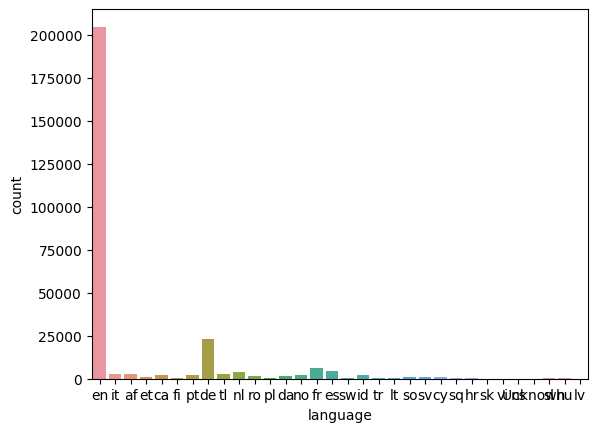

In [14]:
# Overview of languages: 75% of books are English

sns.countplot(df_books, x = 'language')
print(df_books['language'].value_counts(normalize=True).mul(100).round(1).astype(str) + '%')

In [16]:
# Only keep English books in dataframe. Drop rows where the language is not English.
df_books = df_books[df_books['language'] == 'en']

# Reset index after dropping rows
df_books = df_books.reset_index(drop=True)

In [39]:
# Create a unique identifier for each row
df_books['identifier'] = range(1, len(df_books) + 1)

# Create a common identifier for duplicates, unique for each group
df_books['common_identifier'] = df_books.groupby(['book_title', 'book_author'])['identifier'].transform('first')

In [48]:
# Group by 'common_identifier' and collect unique ISBNs for each group
common_identifier_dict = df_books.groupby('common_identifier')['isbn'].unique().to_dict()

common_identifier_dict

{'0195153448': 1,
 '0801319536': 1,
 '0002005018': 2,
 '0060973129': 3,
 '0374157065': 4,
 '0393045218': 5,
 '0399135782': 6,
 '080410753X': 6,
 '080410753x': 6,
 '1590400356': 6,
 '1558002669': 6,
 '0425176428': 7,
 '0399145761': 7,
 '0671870432': 8,
 '0446365505': 8,
 '0374234574': 8,
 '0679425608': 9,
 '0156005492': 9,
 '074322678X': 10,
 '0684815109': 10,
 '0771074670': 11,
 '080652121X': 12,
 '0887841740': 13,
 '1552041778': 14,
 '1558746218': 15,
 '1558746226': 15,
 '1567407781': 16,
 '1575663937': 17,
 '1881320189': 18,
 '0440234743': 19,
 '0385493800': 19,
 '0099245027': 19,
 '0440295734': 19,
 '0553502271': 19,
 '0452264464': 20,
 '0609804618': 21,
 '1841721522': 22,
 '1879384493': 23,
 '0061076031': 24,
 '0439095026': 25,
 '0689821166': 26,
 '0971880107': 27,
 '0345402871': 28,
 '0679446486': 28,
 '0613072103': 28,
 '0679452664': 28,
 '0679457976': 28,
 '0345417623': 29,
 '0679444815': 29,
 '061333633X': 29,
 '037540435X': 29,
 '3442451221': 29,
 '0345468260': 29,
 '073940638

In [18]:
# Print the dictionary
print(common_identifier_dict)

{1: array(['0195153448', '0801319536'], dtype=object), 2: array(['0002005018'], dtype=object), 3: array(['0060973129'], dtype=object), 4: array(['0374157065'], dtype=object), 5: array(['0393045218'], dtype=object), 6: array(['0399135782', '080410753X', '080410753x', '1590400356',
       '1558002669'], dtype=object), 7: array(['0425176428', '0399145761'], dtype=object), 8: array(['0671870432', '0446365505', '0374234574'], dtype=object), 9: array(['0679425608', '0156005492'], dtype=object), 10: array(['074322678X', '0684815109'], dtype=object), 11: array(['0771074670'], dtype=object), 12: array(['080652121X'], dtype=object), 13: array(['0887841740'], dtype=object), 14: array(['1552041778'], dtype=object), 15: array(['1558746218', '1558746226'], dtype=object), 16: array(['1567407781'], dtype=object), 17: array(['1575663937'], dtype=object), 18: array(['1881320189'], dtype=object), 19: array(['0440234743', '0385493800', '0099245027', '0440295734',
       '0553502271'], dtype=object), 20: a

In [21]:
df_books.loc[df_books.duplicated(subset = 'book_title', keep = False), ['isbn', 'book_title', 'book_author', 'common_identifier']].sort_values(by='book_title')

,isbn,book_title,book_author,common_identifier
156341,1565920317,!%@ (A Nutshell Handbook),Donnalyn Frey,75638
75637,1565920465,!%@ (A Nutshell Handbook),Donnalyn Frey,75638
158204,0792277295,'A Hell Of A Place To Lose A Cow': An American...,Tim Brookes,140618
140618,0792276833,'A Hell Of A Place To Lose A Cow': An American...,Tim Brookes,140618
94187,0385007515,'Salem'S Lot,Stephen King,10439
...,...,...,...,...
267601,0887306314,"\Yes\"" Or \""No\"": The Guide To Better Decisions""",Spencer Johnson,136768
109636,0312113536,"\You'Re Okay, It'S Just A Bruise\"": A Doctor'S...",Rob Huizenga,88694
88693,0312136277,"\You'Re Okay, It'S Just A Bruise\"": A Doctor'S...",Rob Huizenga,88694
185464,3492218091,Ã?Â?Berleben In Der Wã?Â¼Ste Danakil.,Rã?Â¼Diger Nehberg,185464


In [20]:
# Descriptive information

print('Unique values for Authors: ' + str(df_books['book_author'].nunique()))
print('Unique values for Titles: ' + str(df_books['book_title'].nunique()))
print('Unique values for Identifier: ' + str(df_books['common_identifier'].nunique()))
print('Unique values for ISBN: ' + str(df_books['isbn'].nunique()))

Unique values for Authors: 99340
Unique values for Titles: 238962
Unique values for Identifier: 248238
Unique values for ISBN: 271358


In [23]:
df_books.shape

(271358, 8)

In [28]:
#Keep only rows with unique common_identifier

df_unique = df_books.drop_duplicates(subset = 'common_identifier', keep = 'first')

df_unique.shape

(248238, 8)

In [25]:
df_books.loc[df_books.duplicated(subset = 'book_author', keep = False), ['isbn', 'book_title', 'book_author', 'common_identifier', 'language']].sort_values(by='book_title')

In [47]:
# Define a regular expression pattern for matching variations
pattern = re.compile(r'(Len|L\.?\s?N\.?|Leo)\s*([Nn]\.)?\s*Tolsto[iy]')

# Replace variations with "Leo N. Tolstoy" in the 'book_author' column
df_books['book_author'] = df_books['book_author'].replace(pattern, 'Leo N. Tolstoy', regex=True)

In [55]:
# Fuzzy string matching for book titles.
from rapidfuzz import fuzz
from rapidfuzz import process

# Function to find the most similar string in a list
def find_most_similar(reference_string, string_list):
    similarities = process.extractOne(reference_string, string_list, scorer=fuzz.token_set_ratio)
    if similarities[1] >= 90:  # Adjust the threshold as needed
        return similarities[0]
    else:
        return reference_string

# Create a set of unique book titles
unique_titles = set(df_books['book_title'])

# Create a dictionary to map authors to their corresponding updated titles
author_to_title_mapping = {}

# Iterate through rows and update titles only when authors are identical
for index, row in df_books.iterrows():
    author = row['book_author']
    title = row['book_title']
    
    # Check if author is already in the mapping
    if author in author_to_title_mapping:
        updated_title = find_most_similar(title, unique_titles)
        author_to_title_mapping[author].append(updated_title)
    else:
        author_to_title_mapping[author] = [title]

# Create a new column 'updated_book_title' based on the mapping
df_books['updated_book_title'] = df_books.apply(lambda row: find_most_similar(row['book_title'], author_to_title_mapping[row['book_author']]), axis=1)

# Print the DataFrame with the new 'updated_book_title' column
print(df_books)

              isbn                                         book_title  \
0       0195153448                                Classical Mythology   
1       0060973129                               Decision In Normandy   
2       0374157065  Flu: The Story Of The Great Influenza Pandemic...   
3       0393045218                             The Mummies Of Urumchi   
4       0399135782                             The Kitchen God'S Wife   
...            ...                                                ...   
204870  0440400988                         There'S A Bat In Bunk Five   
204871  0525447644                            From One To One Hundred   
204872  006008667X  Lily Dale : The True Story Of The Town That Ta...   
204873  0192126040                        Republic (World'S Classics)   
204874  0767409752  A Guided Tour Of Rene Descartes' Meditations O...   

                book_author year_of_publication  \
0        Mark P. O. Morford                2002   
1              Carlo 

In [60]:
# Save df as csv. Runtime for some code (e.g., fuzzy string matching takes multiple hours)
df_books.to_csv('books_new.csv', encoding='utf-8', index=False)

In [ ]:
# Functions.


def detect_language(text):
    try:
        return detect(text)
    except:
        return 'Unknown'

def clean_data_books(df):
    """
    Perform various data cleaning operations on the DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame to be cleaned.

    Returns:
    - pd.DataFrame: The cleaned DataFrame.
    """
    # Snakecase column names
    df.columns = df.columns.str.replace("-", "_").str.lower()

    # Specify problematic characters and their replacements
    problematic_characters = {
        'Ã?Â?': 'ß', 
        'Ã?Â¼': 'ü',
        'Ã¼': 'ü',
        'Ã?Â¤': 'ä',
        'Ã?Â¶': 'ö',
        'Ã?Â©': 'é',
        'Ã?Â¨': 'è',
        'Ã?Â': 'à',
        'àº': 'ú',
        'àª': 'ê',
        'à§': 'ç',
        'à¯': 'ï',
        'à«': 'ë',
        'à®': 'î', 
        'à±': 'ñ',
        'à¢': 'â',
        'à¡': 'á',
        'à³': 'ó',
        'à´': 'ō',
        'à»': 'ū',
        '&Amp;': '&',
        'ã¡': 'á',
        'Ã?': 'ö',
        'ã¶': 'ö'
    }

    # Apply the replacements to the specified columns
    for column in ['book_title', 'book_author']:
        for old_char, new_char in problematic_characters.items():
            df[column] = df[column].str.replace(old_char, new_char)

    # Capitalize the first letter of each word in specified columns
    df[['book_title', 'book_author']] = df[['book_title', 'book_author']].apply(lambda x: x.str.title())

    # Imputation of missing publisher values
    df.loc[(df['isbn'] == '1931696993') | (df['isbn'] == '193169656X'), 'publisher'] = "NovelBooks"

    # Drop rows with missing values in 'book_author'
    df.dropna(subset=['book_author'], how='all', inplace=True)

    # Drop columns 'image_url_s' and 'image_url_l'
    df.drop(columns=['image_url_l', 'image_url_s'], axis=1, inplace=True)

    # Language detection
    df['language'] = df['book_title'].apply(detect_language)

    # Only keep English books and reset index
    df = df[df['language'] == 'en'].reset_index(drop=True)

    return df


